Bayes Rule Book:

https://www.bayesrulesbook.com/chapter-16.html

Materials from the Bayes Rule github:

https://github.com/bayes-rules/bayesrules

# Imports

In [1]:
import math, pyreadr
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from os.path import exists

import pyro
import torch as t
import pyro.distributions as dist
from pyro.infer import MCMC
from pyro.infer.mcmc.nuts import NUTS

# Hierarchical Models in Pyro

From Pyro Documentation: https://num.pyro.ai/en/stable/tutorials/bayesian_hierarchical_linear_regression.html

In [53]:
train = pd.read_csv(
    "https://gist.githubusercontent.com/ucals/"
    "2cf9d101992cb1b78c2cdd6e3bac6a4b/raw/"
    "43034c39052dcf97d4b894d2ec1bc3f90f3623d9/"
    "osic_pulmonary_fibrosis.csv"
)
train.head()

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker


In [54]:
def model(PatientID, Weeks, FVC_obs=None):
    μ_α = pyro.sample("μ_α", dist.Normal(0.0, 100.0))
    σ_α = pyro.sample("σ_α", dist.HalfNormal(100.0))
    μ_β = pyro.sample("μ_β", dist.Normal(0.0, 100.0))
    σ_β = pyro.sample("σ_β", dist.HalfNormal(100.0))

    unique_patient_IDs = np.unique(PatientID)
    n_patients = len(unique_patient_IDs)

    with pyro.plate("plate_i", n_patients):
        α = pyro.sample("α", dist.Normal(μ_α, σ_α))
        β = pyro.sample("β", dist.Normal(μ_β, σ_β))

    σ = pyro.sample("σ", dist.HalfNormal(100.0))
    FVC_est = α[PatientID] + β[PatientID] * Weeks

    with pyro.plate("data", len(PatientID)):
        pyro.sample("obs", dist.Normal(FVC_est, σ), obs=FVC_obs)

In [68]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
train["PatientID"] = le.fit_transform(train["Patient"].values)

FVC_obs   = t.tensor(train["FVC"].values, dtype=t.float)
Weeks     = t.tensor(train["Weeks"].values, dtype=t.float)
PatientID = t.tensor(train["PatientID"].values, dtype=t.long)

In [70]:
nuts_kernel = NUTS(model)

mcmc = MCMC(nuts_kernel, 100, warmup_steps=10)
mcmc.run(PatientID, Weeks, FVC_obs=FVC_obs)

posterior_samples = mcmc.get_samples()

Sample: 100%|██████████| 110/110 [04:34,  2.49s/it, step size=3.67e-04, acc. prob=1.000]


# Spotify

For spotify song popuarity:

- What’s the typical popularity of a Spotify song?
- To what extent does popularity vary from artist to artist?
- For any single artist, how much might popularity vary from song to song?

## Data

In [2]:
file_name = 'spotify'
folder    = 'ch16'

data_url = f"https://github.com/bayes-rules/bayesrules/raw/master/data/{file_name}.rda"

if exists(f"/Users/zr/Geek/tutorials/bayesian_rules/{folder}/{file_name}.csv"):
    df = pd.read_csv(f"/Users/zr/Geek/tutorials/bayesian_rules/{folder}/{file_name}.csv")
    df = df.drop(columns=['Unnamed: 0'])
else:
    # pyreadr downloads remote file, saves locally and converts the RDA datafile to a pandas DataFrame
    file_path = f"/Users/zr/Geek/tutorials/bayesian_rules/{folder}/{file_name}.rda"
    pyreadr.download_file(data_url, file_path)
    result = pyreadr.read_r(file_path)
    df = result[file_name]
    df.to_csv(f"/Users/zr/Geek/tutorials/bayesian_rules/{folder}/{file_name}.csv")

In [3]:
data = df.copy()

In [4]:
columns = ['artist', 'title', 'popularity']
df[columns]

,artist,title,popularity
0,Alok,On & On,79.0
1,Alok,All The Lies,56.0
2,Alok,Hear Me Now,75.0
3,Alok,The Wall,65.0
4,Alok,Hear Me Now,52.0
...,...,...,...
345,Zeds Dead,Frontlines,58.0
346,Zeds Dead,Stardust,44.0
347,Zeds Dead,Save My Grave,54.0
348,Zeds Dead,Shake,49.0


<img src="images/ch16-hierarchy.png" width=600/>

In [5]:
df[['artist', 'popularity']].groupby('artist').agg(['mean', 'count']).sort_values(by=('popularity', 'mean'), ascending=False).iloc[np.r_[0:2, -2:0]]

popularity      
                    mean count
artist                        
Camilo         81.000000     9
Lil Skies      79.333333     3
Chris Goldarg  16.400000    10
Mia X          13.250000     4

## Complete Pooled Model

In [6]:
px.histogram(df.popularity)

From book:
>Though these ratings appear somewhat left skewed, we’ll make one more simplification in our complete pooling analysis by assuming Normality.


> ...we’ll utilize the following Normal-Normal complete pooled model with a prior for μ that reflects our weak understanding that the average popularity rating is around 50 and, independently, a weakly informative prior for σ

- $Y_{ij}|\mu,\sigma \sim N(\mu, \sigma)$
- $~~~~~~~~~~\mu    \sim N(50, 52)$
- $~~~~~~~~~~\sigma \sim Exp(0.048)$

Where

- μ = global mean popularity; and
- σ = global standard deviation in popularity from song to song.

In [7]:
y = t.tensor(df.popularity.values, dtype=t.float)

def model(y=None):
    global_mean  = pyro.sample('global_mean', dist.Normal(50, 52))
    global_sigma = pyro.sample('global_sigma',dist.Exponential(0.048))

    pyro.sample('obs', dist.Normal(global_mean, global_sigma), obs=y)

mcmc = MCMC(NUTS(model), 500, 50)
mcmc.run(y)
mcmc.summary()

Sample: 100%|██████████| 550/550 [00:02, 200.05it/s, step size=7.55e-02, acc. prob=0.643]


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
   global_mean     58.49      1.10     58.49     56.88     60.38    240.47      1.00
  global_sigma     20.70      0.74     20.68     19.58     22.06    206.83      1.00

Number of divergences: 0


In [8]:
ff.create_distplot([df.popularity, np.random.normal(58.5, 20.84, len(df))], ['Actual', 'Predicted'])

## No Pooled Model

- $Y_{ij}|\mu_j,\sigma_j \sim N(\mu_j, \sigma)$
- $~~~~~~~~~~~~\mu_j \sim N(50, s_j)$
- $~~~~~~~~~~~~\sigma_j \sim Exp(0.048)$

Where,

- $\mu_j, s_j$ are local to each artist
- $\sigma$ is a global param

In [9]:
# the code for this would be a mess. It's just a separate model for each artist. Considering the book is just pulling it as an demonstrable alternative extreme, we'll omit.

## Building a hierarchical model (semi-pooled)

3 Layers:

1. $Y_{ij}|\mu_j,\sigma_y \sim$ models dist of song popularity *within* a specific artist
2. $\mu_j~|\mu,\sigma_{\mu} ~\sim$ models how the typical popularity $\mu_j$ varies **between** artists
3. $\mu, \sigma_y, \sigma_{\mu} ~~ \sim$ global priors

In [72]:
# We need artists ID for index and then actual song values
le = LabelEncoder()
df['artist_id'] = le.fit_transform(df.artist.values)

artist_ids      = t.tensor(df.artist_id.values, dtype=t.long) # indexes must be long or bool
song_popularity = t.tensor(df.popularity, dtype=t.float)

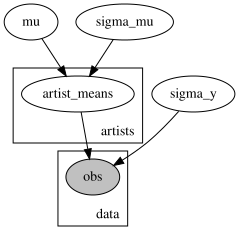

In [76]:
def model(artist_ids, song_popularity):
    global_mean  = pyro.sample('mu', dist.Normal(50,50))
    scale_artist = pyro.sample('sigma_mu', dist.Exponential(1.))
    scale_song   = pyro.sample('sigma_y', dist.Exponential(0.048))

    with pyro.plate('artists', df.artist.nunique()):
        artist_means = pyro.sample(f'artist_means', dist.Normal(global_mean, scale_artist))

    artist_mu = artist_means[artist_ids]

    with pyro.plate('data', len(artist_ids)):
        pyro.sample('obs', dist.Normal(artist_mu, scale_song), obs=song_popularity)

pyro.render_model(model, model_args=(artist_ids, song_popularity))

In [120]:
mcmc = MCMC(NUTS(model), 1000, 200)
mcmc.run(artist_ids, song_popularity)
mcmc.summary()

Sample: 100%|██████████| 1200/1200 [02:24,  8.30it/s, step size=4.52e-01, acc. prob=0.887]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
 artist_means[0]     64.11      3.10     64.08     59.25     69.34   1334.75      1.00
 artist_means[1]     47.30      6.15     47.44     37.59     57.68   1460.42      1.00
 artist_means[2]     59.18      6.11     59.46     48.45     68.18   1301.62      1.00
 artist_means[3]     45.34      6.76     45.44     35.83     57.89   1081.50      1.00
 artist_means[4]     68.92      2.52     68.85     64.31     72.73   1183.64      1.00
 artist_means[5]     49.81      5.29     49.75     41.24     58.63   1475.99      1.00
 artist_means[6]     51.04      6.14     50.93     41.04     61.19   2182.20      1.00
 artist_means[7]     76.33      2.35     76.38     72.18     79.74   1784.71      1.00
 artist_means[8]     77.50      4.76     77.57     69.12     84.63   1444.00      1.00
 artist_means[9]     20.65      4.38     20.68     13.18     27.31    553.78      1.00
artist_means[10]     41.37      6.89     4

In [121]:
samples = mcmc.get_samples()['artist_means'].detach().numpy().T

In [122]:
ff.create_distplot(samples, group_labels=[f"artist_{i}" for i in df.artist_id.unique()], show_rug=False)

In [126]:
dist_data = []
dist_labels = []
for id in df.artist_id.unique():
    dist_data.append(df.loc[df.artist_id==id, 'popularity'])
    dist_data.append(samples[id])
    dist_labels.extend([f'{id}_act',f'{id}_pred'])

dist_fig = ff.create_distplot(dist_data, dist_labels, show_rug=False)
dist_fig

In [238]:
fig = make_subplots(rows=22, cols=2, subplot_titles=[f'artist_{i}' for i in range(df.artist_id.nunique())], horizontal_spacing=.03, vertical_spacing=.015)

for i in range(0, df.artist_id.nunique()*2, 2):
    id = i//2
    fig.add_trace(go.Histogram(dist_fig['data'][i]),   row=(id//2)+1, col=(id%2)+1)
    fig.add_trace(go.Scatter(dist_fig['data'][i+88]),  row=(id//2)+1, col=(id%2)+1)

    fig.add_trace(go.Histogram(dist_fig['data'][i+1]), row=(id//2)+1, col=(id%2)+1)
    fig.add_trace(go.Scatter(dist_fig['data'][i+89]),  row=(id//2)+1, col=(id%2)+1)

fig.update_layout(height=22*300)
fig